In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import os, gc
import pickle
import datetime, time
from tqdm import tqdm_notebook as tqdm


from sklearn import preprocessing

%matplotlib inline

In [2]:
def preprocessing(train_df, calendar_df, sell_prices_df):
    sell_prices_df['id'] = sell_prices_df['item_id'].astype('str')+'_'+sell_prices_df['store_id']+'_validation'
    d_cols = train_df.columns[train_df.columns.str.startswith('d_')].values.tolist()
    
    event_type_1 = pd.get_dummies(calendar_df.event_type_1)
    event_type_1.columns = [f'{col}_event_type_1' for col in event_type_1.columns]
    event_type_2 = pd.get_dummies(calendar_df.event_type_1)
    event_type_2.columns = [f'{col}_event_type_2' for col in event_type_2.columns]
    calendar_data = pd.concat([
        calendar_df.drop(columns=['event_name_1', 'event_type_1', 'event_name_2', 'event_type_2'])[['wday', 'd','month','snap_CA', 'snap_TX', 'snap_WI']],
        event_type_1,
        event_type_2
    ], axis=1)
    calendar_data = calendar_data.set_index('d').T
    
    
    
    sell_prices_data = sell_prices_df[sell_prices_df.wm_yr_wk.isin(calendar_df.wm_yr_wk.unique())]
    sell_prices_data.reset_index(drop=True, inplace=True)
    tmp = sell_prices_data.groupby(['id'])[['wm_yr_wk', 'sell_price']].apply(lambda x: x.set_index('wm_yr_wk')['sell_price'].to_dict()).to_dict()
    d = calendar_df.d
    wm_yr_wk = calendar_df.wm_yr_wk
    price_data = {}
    for col in tqdm(train_df.id.unique()):
        price_data[col] = wm_yr_wk.map(tmp[col])
    price_data = pd.DataFrame(price_data)
    price_data.index = d
    
    
    is_sell = price_data.notnull().astype(float).T
    price_data = price_data.fillna(0)
    
    train_df = train_df.T
    train_df.columns = train_df.loc['id', :].values
    train_df = train_df.T
    
    return train_df, calendar_df, calendar_data, price_data, is_sell

In [3]:
#path = '/Users/kanoumotoharu/Downloads/m5-forecasting-accuracy/'
path = '/Users/abcdm/Downloads/m5-forecasting-accuracy/'
#path = '../input/m5-forecasting-accuracy/'

In [4]:
%%time
train_df = pd.read_csv(path+'sales_train_validation.csv')
calendar_df = pd.read_csv(path+'calendar.csv')
sell_prices_df = pd.read_csv(path+'sell_prices.csv')
sample_submission_df = pd.read_csv(path+'sample_submission.csv')

Wall time: 4.64 s


In [5]:
df, calendar_df, calendar_data, price_data, is_sell = preprocessing(train_df, calendar_df, sell_prices_df)

In [6]:
df

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
HOBBIES_1_001_CA_1_validation,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
HOBBIES_1_002_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
HOBBIES_1_003_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
HOBBIES_1_004_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
HOBBIES_1_005_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FOODS_3_823_WI_3_validation,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,...,2,0,0,0,0,0,1,0,0,1
FOODS_3_824_WI_3_validation,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
FOODS_3_825_WI_3_validation,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,...,2,1,0,2,0,1,0,0,1,0
FOODS_3_826_WI_3_validation,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,...,0,0,1,0,0,1,0,3,1,3


In [7]:
d_cols = [f'd_{i}' for  i in range(1820,1914)]

In [10]:
trn_df = df[['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id']+d_cols]

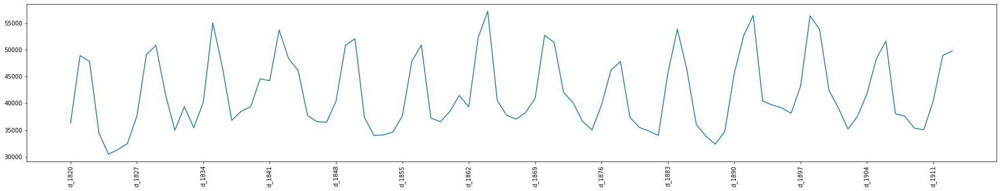

In [30]:
fig = plt.figure(figsize=(30,5))
ax = fig.add_subplot(111)
ax.plot(d_cols, trn_df[d_cols].sum().values)
ax.set_xticks([d_cols[i] for i in range(len(d_cols)) if i%7==0])
plt.xticks(rotation=90)
plt.show()

In [31]:
group_ids = (
    'state_id',
    'store_id',
    'cat_id',
    'dept_id',
    ['state_id', 'cat_id'],
    ['state_id', 'dept_id'],
    ['store_id', 'cat_id'],
    ['store_id', 'dept_id'],
    'item_id',
    ['item_id', 'state_id'],
    ['item_id', 'store_id']
)

In [50]:
trn_df['all_id'] = trn_df.index

In [53]:
for g in group_ids:
    print(g)
    print(len(trn_df.groupby(g)['all_id'].sum()))

state_id
3
store_id
10
cat_id
3
dept_id
7
['state_id', 'cat_id']
9
['state_id', 'dept_id']
21
['store_id', 'cat_id']
30
['store_id', 'dept_id']
70
item_id
3049
['item_id', 'state_id']
9147
['item_id', 'store_id']
30490


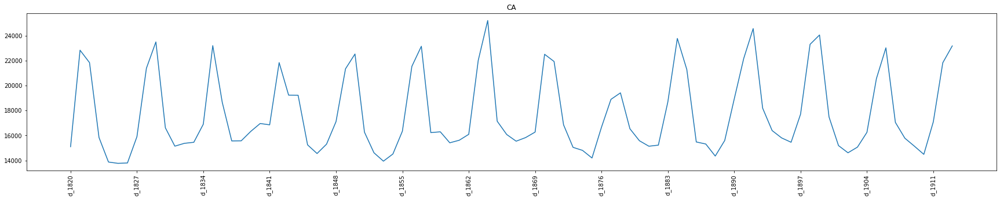

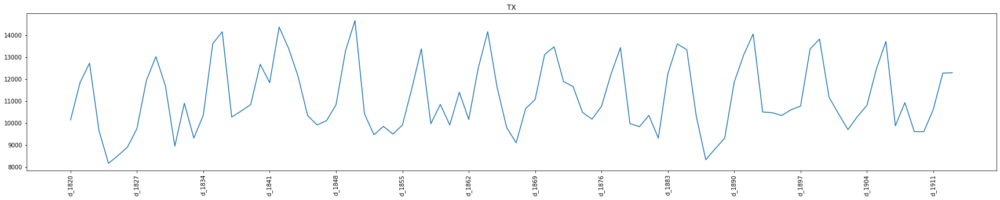

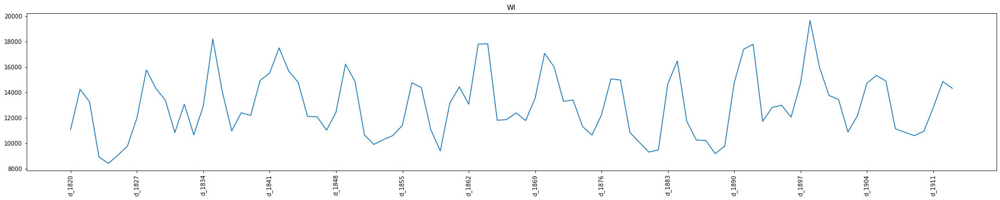

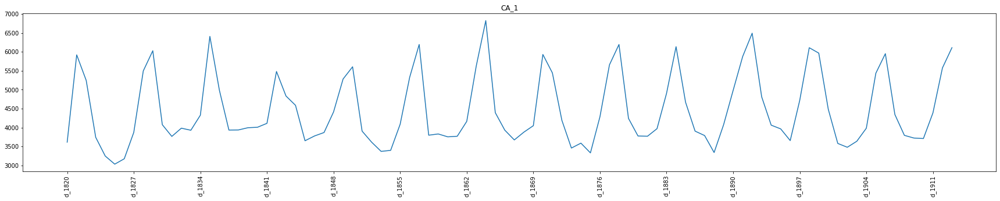

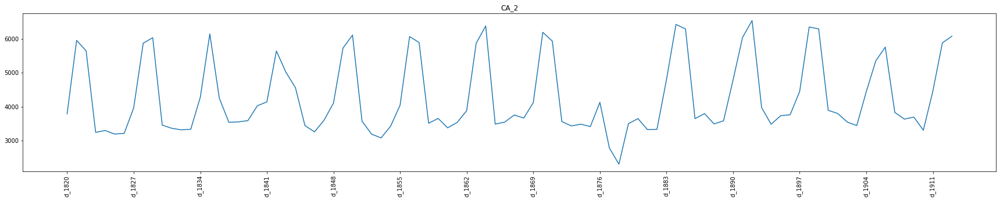

...

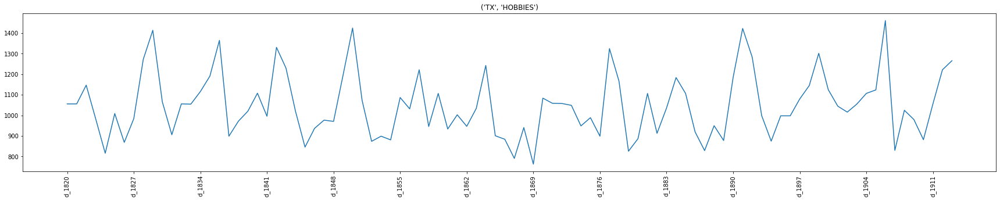

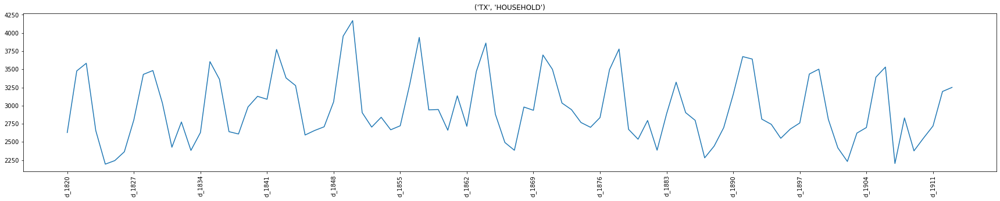

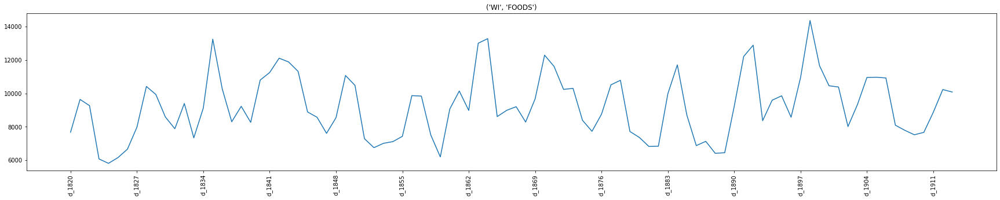

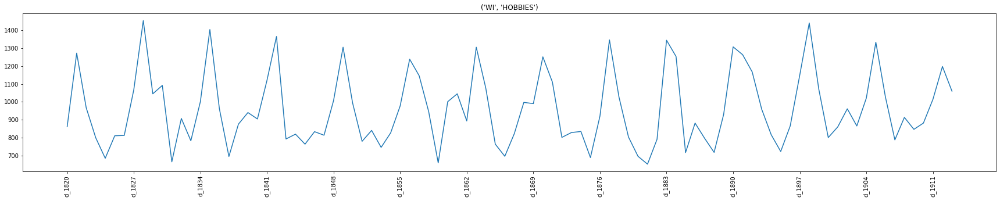

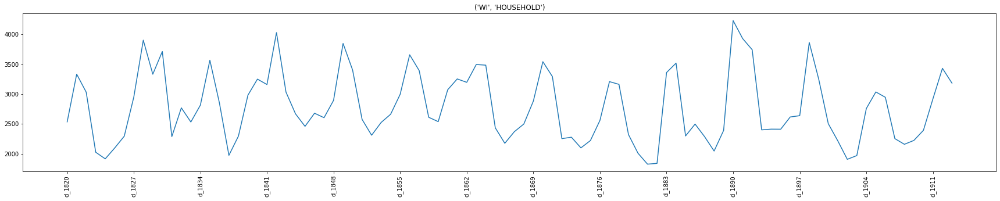

In [55]:
for g in group_ids[:-6]:
    a = trn_df.groupby(g)[d_cols].sum()
    for v in a.iterrows():
        fig = plt.figure(figsize=(30,5))
        ax = fig.add_subplot(111)
        ax.plot(d_cols, v[1].values)
        ax.set_xticks([d_cols[i] for i in range(len(d_cols)) if i%7==0])
        plt.xticks(rotation=90)
        plt.title(v[0])
        plt.show()

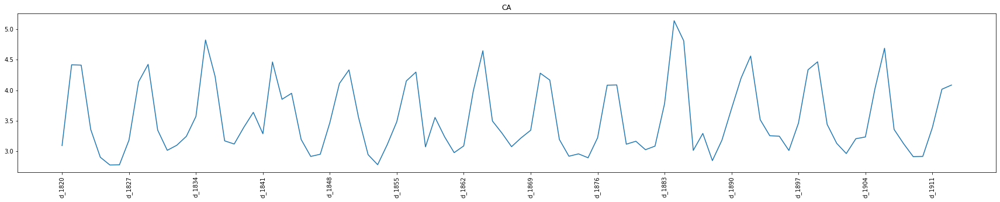

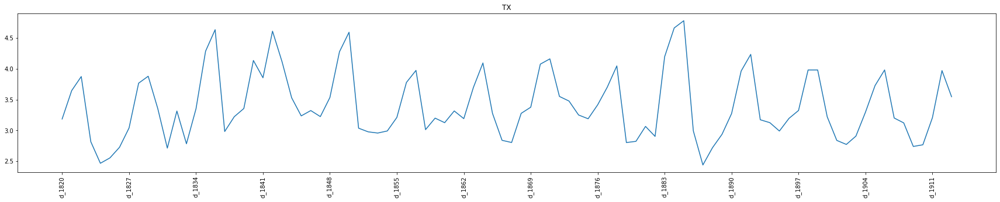

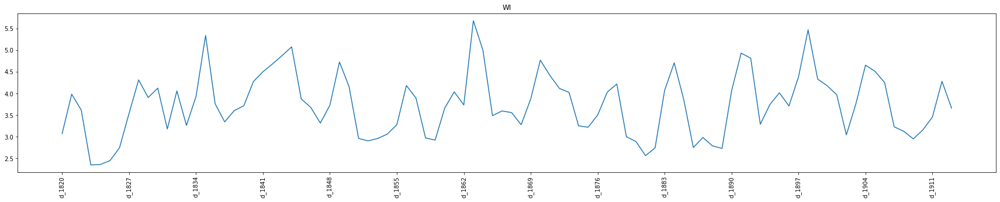

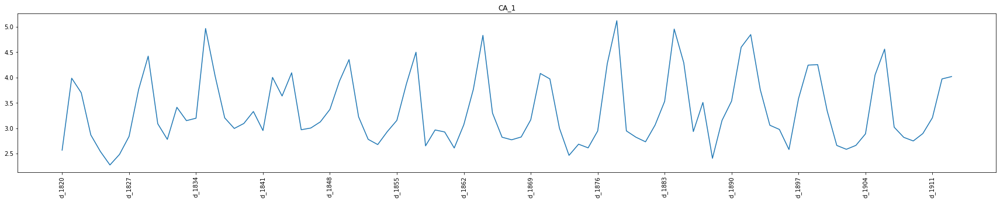

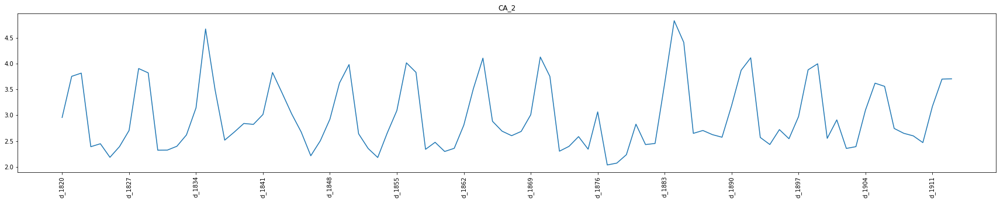

...

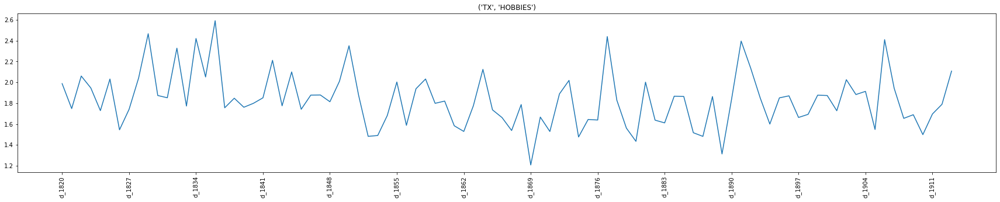

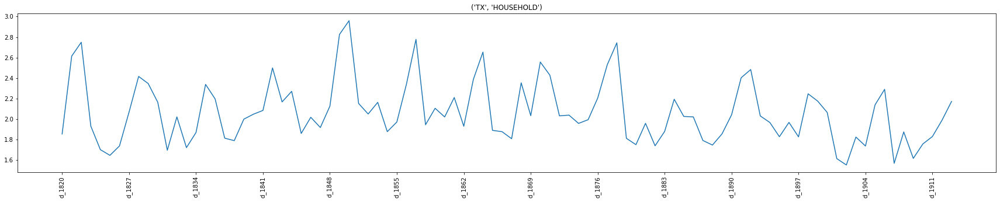

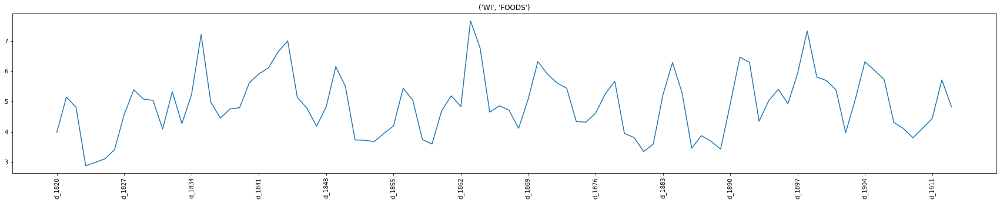

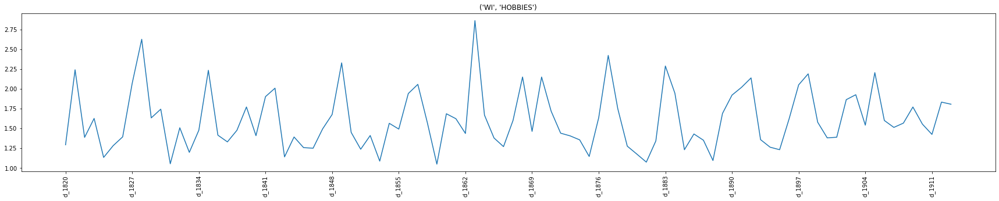

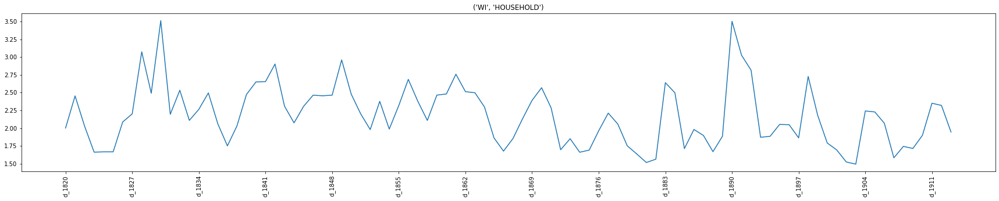

In [56]:
for g in group_ids[:-6]:
    a = trn_df.groupby(g)[d_cols].std()
    for v in a.iterrows():
        fig = plt.figure(figsize=(30,5))
        ax = fig.add_subplot(111)
        ax.plot(d_cols, v[1].values)
        ax.set_xticks([d_cols[i] for i in range(len(d_cols)) if i%7==0])
        plt.xticks(rotation=90)
        plt.title(v[0])
        plt.show()

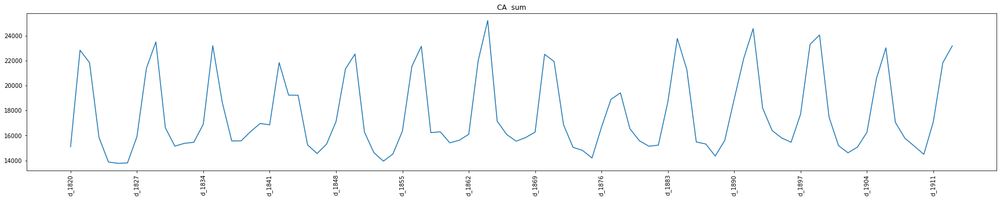

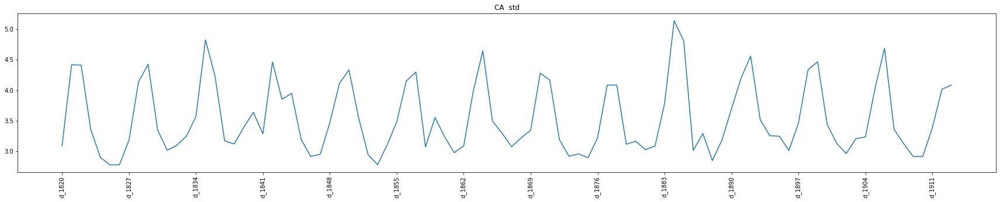

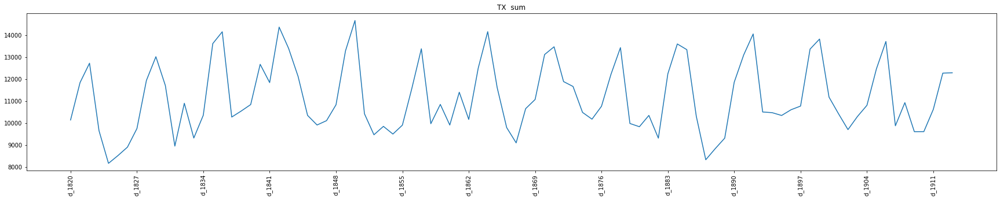

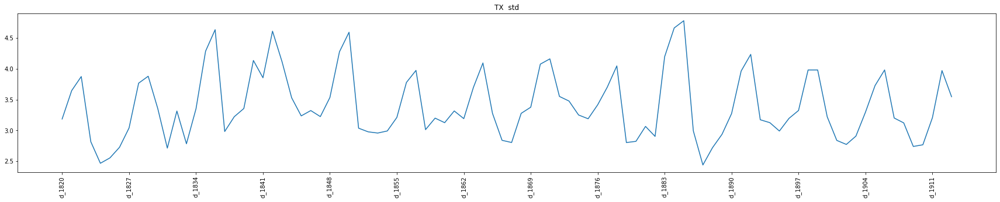

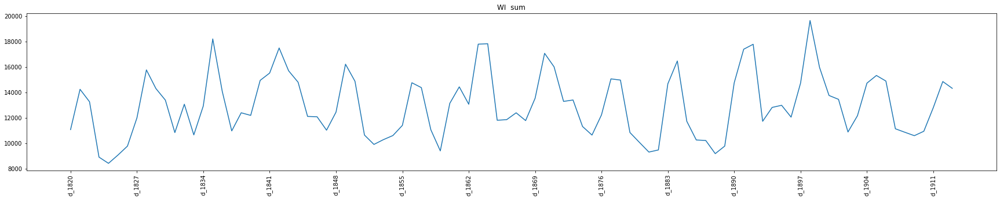

...

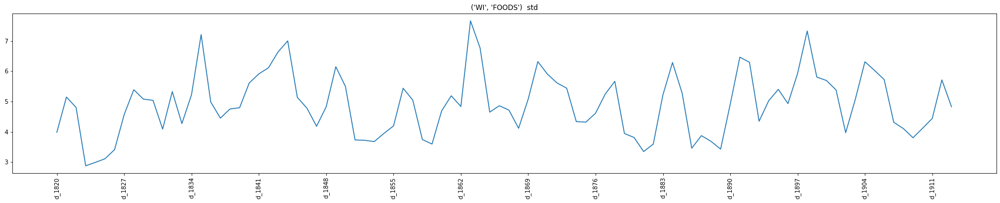

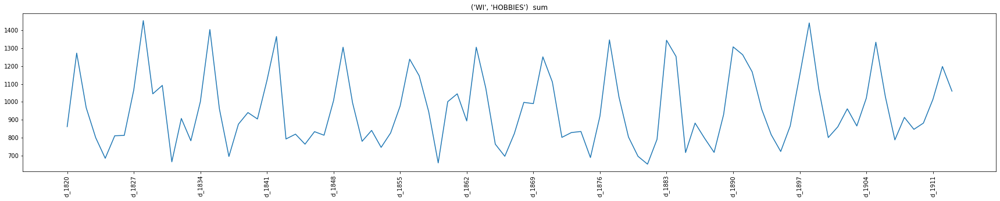

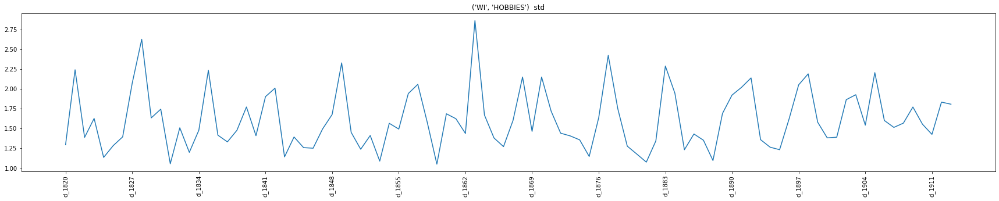

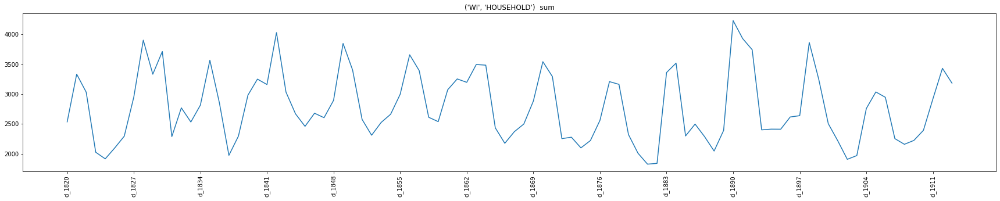

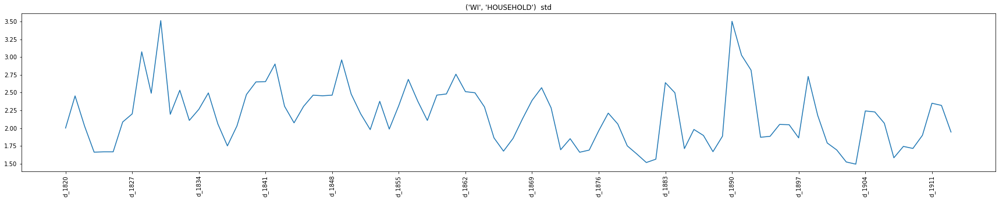

In [57]:
for g in group_ids[:-6]:
    a = trn_df.groupby(g)[d_cols].sum()
    b = trn_df.groupby(g)[d_cols].std()
    for v1, v2 in zip(a.iterrows(), b.iterrows()):
        fig = plt.figure(figsize=(30,5))
        ax = fig.add_subplot(111)
        ax.plot(d_cols, v1[1].values)
        ax.set_xticks([d_cols[i] for i in range(len(d_cols)) if i%7==0])
        plt.xticks(rotation=90)
        plt.title(str(v1[0])+'  sum')
        plt.show()
        
        fig = plt.figure(figsize=(30,5))
        ax = fig.add_subplot(111)
        ax.plot(d_cols, v2[1].values)
        ax.set_xticks([d_cols[i] for i in range(len(d_cols)) if i%7==0])
        plt.xticks(rotation=90)
        plt.title(str(v2[0])+'  std')
        plt.show()

In [76]:
v = trn_df[d_cols].T.diff()
v = abs(v)
v = v.mean(0)

In [77]:
v.sort_values(ascending=False).head(20)

FOODS_3_070_WI_2_validation      31.784946
FOODS_3_090_CA_3_validation      30.580645
HOBBIES_1_234_CA_3_validation    30.559140
FOODS_3_090_WI_3_validation      29.795699
FOODS_3_498_WI_2_validation      22.795699
FOODS_3_120_CA_1_validation      22.516129
FOODS_3_090_TX_3_validation      22.096774
FOODS_3_090_TX_2_validation      21.870968
FOODS_3_681_WI_3_validation      20.096774
FOODS_2_326_WI_2_validation      18.935484
FOODS_3_234_WI_3_validation      18.903226
FOODS_3_090_CA_1_validation      18.763441
FOODS_3_586_TX_2_validation      18.311828
FOODS_3_090_TX_1_validation      18.193548
FOODS_3_412_WI_2_validation      18.053763
FOODS_2_360_WI_2_validation      18.021505
FOODS_3_120_TX_2_validation      17.666667
FOODS_3_150_WI_2_validation      16.849462
FOODS_3_752_WI_2_validation      16.784946
FOODS_3_090_CA_2_validation      16.634409
dtype: float64

In [78]:
v.sort_values(ascending=False).tail(20)

HOBBIES_2_077_WI_1_validation      0.0
FOODS_3_073_CA_3_validation        0.0
HOBBIES_2_118_WI_2_validation      0.0
HOBBIES_2_110_WI_2_validation      0.0
FOODS_2_218_TX_1_validation        0.0
HOBBIES_2_065_WI_2_validation      0.0
FOODS_3_538_CA_3_validation        0.0
HOBBIES_2_030_WI_2_validation      0.0
HOBBIES_1_180_TX_3_validation      0.0
HOBBIES_2_014_WI_2_validation      0.0
HOBBIES_1_192_TX_3_validation      0.0
HOBBIES_2_001_WI_2_validation      0.0
HOBBIES_1_393_WI_2_validation      0.0
HOUSEHOLD_1_049_WI_1_validation    0.0
HOUSEHOLD_1_124_CA_2_validation    0.0
HOBBIES_1_347_WI_2_validation      0.0
HOBBIES_1_236_TX_3_validation      0.0
HOBBIES_1_335_WI_2_validation      0.0
FOODS_1_126_WI_1_validation        0.0
FOODS_3_732_CA_1_validation        0.0
dtype: float64

In [79]:
trn_df.loc[['FOODS_3_732_CA_1_validation'],:][d_cols]

,d_1820,d_1821,d_1822,d_1823,d_1824,d_1825,d_1826,d_1827,d_1828,d_1829,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
FOODS_3_732_CA_1_validation,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [81]:
is_sell.loc[['FOODS_3_732_CA_1_validation'],:][d_cols]

d,d_1820,d_1821,d_1822,d_1823,d_1824,d_1825,d_1826,d_1827,d_1828,d_1829,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
FOODS_3_732_CA_1_validation,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


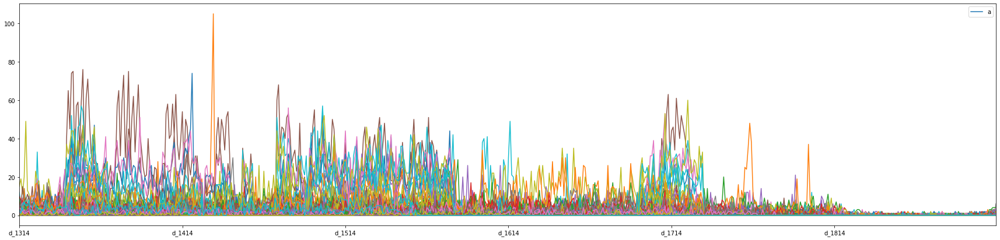

In [124]:
c = v.sort_values(ascending=False).tail(1000).index
df.loc[c,:][[f'd_{i}' for i in range(1,1914)][-600:]].T.plot(
    figsize=(30,7)
)
plt.legend('a')
plt.show()

In [125]:
calendar_data

d,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1960,d_1961,d_1962,d_1963,d_1964,d_1965,d_1966,d_1967,d_1968,d_1969
wday,1,2,3,4,5,6,7,1,2,3,...,7,1,2,3,4,5,6,7,1,2
month,1,1,1,2,2,2,2,2,2,2,...,6,6,6,6,6,6,6,6,6,6
snap_CA,0,0,0,1,1,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,0
snap_TX,0,0,0,1,0,1,0,1,1,1,...,0,1,1,1,0,1,0,0,0,0
snap_WI,0,0,0,0,1,1,0,1,1,0,...,0,1,1,0,1,1,0,0,0,0
Cultural_event_type_1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
National_event_type_1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Religious_event_type_1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sporting_event_type_1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
Cultural_event_type_2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [132]:
t = pd.concat([
    trn_df[d_cols], calendar_data[d_cols]
], axis=0).T

In [137]:
t.head()

,HOBBIES_1_001_CA_1_validation,HOBBIES_1_002_CA_1_validation,HOBBIES_1_003_CA_1_validation,HOBBIES_1_004_CA_1_validation,HOBBIES_1_005_CA_1_validation,HOBBIES_1_006_CA_1_validation,HOBBIES_1_007_CA_1_validation,HOBBIES_1_008_CA_1_validation,HOBBIES_1_009_CA_1_validation,HOBBIES_1_010_CA_1_validation,...,snap_TX,snap_WI,Cultural_event_type_1,National_event_type_1,Religious_event_type_1,Sporting_event_type_1,Cultural_event_type_2,National_event_type_2,Religious_event_type_2,Sporting_event_type_2
d,,,,,,,,,,,,,,,,,,,,,
d_1820,1,0,0,3,0,2,0,13,0,0,...,0,0,0,0,0,0,0,0,0,0
d_1821,0,0,0,0,0,0,0,14,0,1,...,0,0,0,0,0,0,0,0,0,0
d_1822,0,0,0,8,3,1,0,4,0,4,...,0,0,0,0,0,0,0,0,0,0
d_1823,0,0,0,2,0,0,1,3,0,0,...,0,0,0,0,0,0,0,0,0,0
d_1824,1,0,0,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
d_1909,1,1,1,0,1,0,1,4,0,0,...,0,0,0,0,0,0,0,0,0,0
d_1910,3,0,0,1,2,0,0,6,0,0,...,0,0,0,0,0,0,0,0,0,0
d_1911,0,0,1,3,2,2,0,3,0,2,...,0,0,0,0,0,0,0,0,0,0


In [141]:
t = t.groupby(['wday'])[trn_df.index].sum().sum(1)

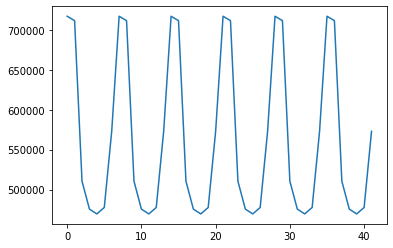

In [148]:
plt.plot(pd.concat([
    t,t,t, t,t, t
] ,axis=0).values)